# Exercise 6.2 Exporatory Analysis

Comparing python libraries to conduct some expoloratory analysis between variables in the data set.

## 1. Importing Libraries and Data

In [1]:
import pandas as pd
import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib
import os

In [2]:
# Check the matplotlib version

matplotlib.__version__

'3.7.0'

In [3]:
#path 

path = r'/Users/katiekulp/Desktop/Data Course/Part 6/DATA'

In [4]:
#import data

df= pd.read_csv(os.path.join(path, 'NEW_CA_data.csv'), index_col = 0)

In [5]:
# Check the import

df.head()

,Census Tract,Total Population,California County,County,countytrim,ZIP,Longitude,Latitude,Ozone,PM2.5,...,Imp. Water Bodies,Solid Waste,Asthma,Low Birth Weight,Cardiovascular Disease,Education,Linguistic Isolation,Poverty,Unemployment,Housing Burden
0,6019001100,3174,Fresno,Fresno County,Fresno,93706,-119.781696,36.709695,0.065,15.40,...,0,21.75,131.64,7.44,14.13,53.3,16.2,76.3,17.6,26.0
1,6071001600,6133,San Bernardino,San Bernardino County,San Bernardino,91761,-117.618013,34.057780,0.062,13.31,...,5,12.00,60.66,7.04,12.94,53.3,33.4,72.5,12.3,34.1
2,6019000200,3167,Fresno,Fresno County,Fresno,93706,-119.805504,36.735491,0.062,15.40,...,0,2.50,142.12,10.16,14.96,42.3,16.7,86.8,16.1,40.1
3,6077000801,6692,San Joaquin,San Joaquin County,San Joaquin,95203,-121.314524,37.940517,0.046,12.54,...,19,27.00,142.17,6.23,14.72,40.8,15.3,61.3,19.6,21.1
4,6019001500,2206,Fresno,Fresno County,Fresno,93725,-119.717843,36.681600,0.065,15.40,...,0,50.80,90.48,4.50,12.82,45.1,14.7,66.4,18.6,28.1


In [7]:
# Columns list

df.columns

Index(['Census Tract', 'Total Population', 'California County', 'ZIP',
       'Longitude', 'Latitude', 'Ozone', 'PM2.5', 'Diesel PM',
       'Drinking Water', 'Pesticides', 'Tox. Release', 'Traffic',
       'Cleanup Sites', 'Groundwater Threats', 'Haz. Waste',
       'Imp. Water Bodies', 'Solid Waste', 'Asthma', 'Low Birth Weight',
       'Cardiovascular Disease', 'Education', 'Linguistic Isolation',
       'Poverty', 'Unemployment', 'Housing Burden'],
      dtype='object')

## 2. Make subsets of data with columns relevant to the analysis based on questions in prev. exercise

Questions to Explore:

Do areas with higher air pollutants (ozone, PM2.5, Diesel PM) have higher rates of asthma, low birth rate, or cardiovascular disease?    
(include ozone, PM2.5, Diesel PM. asthma, low birth rate, cardiovascular disease)

How does traffic affect air pollution?      
(include traffic)  

How does poverty and education relate to health (asthma, low birth rate, or cardiovascular disease)?      
(include poverty, education)   

How does environmental hazards (Pesticides, traffic, cleanup site ect.) relate to health and poverty?   

(include Pesticides, Cleanup Sites, Groundwater Threats, Haz. Waste, Imp. Water Bodies, Solid Waste  

What are the biggest risk factors for high cardiovascular disease?     


In [7]:
# make a list of the column names grouped to make df easier

health = ['Asthma', 'Low Birth Weight','Cardiovascular Disease']

air_pollution = ['Ozone', 'PM2.5', 'Diesel PM' ]

eco_hazards = [ 'Drinking Water', 'Pesticides', 'Tox. Release', 
       'Cleanup Sites', 'Groundwater Threats', 'Haz. Waste',
       'Imp. Water Bodies', 'Solid Waste',]

demographics = ['Poverty', 'Education', 'Unemployment'  ]

In [8]:
# make smaller subsets to make analysis more viewable

# the first one will just have all relevant variables

df_all = df[['Ozone', 'PM2.5', 'Diesel PM',
       'Drinking Water', 'Pesticides', 'Tox. Release', 'Traffic',
       'Cleanup Sites', 'Groundwater Threats', 'Haz. Waste',
       'Imp. Water Bodies', 'Solid Waste', 'Asthma', 'Low Birth Weight',
       'Cardiovascular Disease', 'Education', 'Linguistic Isolation',
       'Poverty', 'Unemployment', 'Housing Burden']]

 # the rest will have specific uses
    
    
df_pollutants = df[health + air_pollution]

df_traffic = df[['Traffic'] + air_pollution]

df_demohealth = df[ health + demographics]
                 
df_ecohazards = df[eco_hazards + health + ['Poverty'] ]               


## 3A. Create a correlation matrix heatmap (colored) in matplotlib

Discuss what the coefficients in the plot mean in terms of the relationships between the variables.

In [10]:
# correlation matrix of all variables

df_all.corr()

,Ozone,PM2.5,Diesel PM,Drinking Water,Pesticides,Tox. Release,Traffic,Cleanup Sites,Groundwater Threats,Haz. Waste,Imp. Water Bodies,Solid Waste,Asthma,Low Birth Weight,Cardiovascular Disease,Education,Linguistic Isolation,Poverty,Unemployment,Housing Burden
Ozone,1.000000,0.401895,-0.214974,0.556655,-0.029987,0.017841,-0.063191,-0.123522,-0.178643,-0.079213,-0.262420,0.008933,0.065048,0.098236,0.398129,0.164149,-0.029124,0.221567,0.288553,0.033120
PM2.5,0.401895,1.000000,0.223431,0.351258,-0.055668,0.107028,0.159486,0.045697,-0.064540,0.040231,-0.170557,-0.040125,0.093264,0.175175,0.148310,0.296531,0.255507,0.233933,0.150586,0.162801
Diesel PM,-0.214974,0.223431,1.000000,-0.123336,-0.055998,0.065954,0.209575,0.190036,0.113508,0.171054,0.082106,-0.029854,0.185347,0.164683,-0.029067,0.184462,0.304435,0.194384,0.026115,0.255570
Drinking Water,0.556655,0.351258,-0.123336,1.000000,0.081906,0.028472,0.009252,-0.034622,-0.076736,-0.019002,-0.158210,0.109266,-0.055355,0.058315,0.184030,0.199980,0.104862,0.177043,0.176425,0.060579
Pesticides,-0.029987,-0.055668,-0.055998,0.081906,1.000000,-0.022703,-0.045300,-0.006623,0.014676,-0.000380,0.115014,0.045788,-0.004315,-0.020736,-0.008432,0.078395,0.039241,0.027837,-0.009024,-0.024530
Tox. Release,0.017841,0.107028,0.065954,0.028472,-0.022703,1.000000,0.109159,0.116225,-0.007671,0.094013,-0.046812,0.053837,-0.039193,0.015382,-0.013309,0.102966,0.090127,0.052085,-0.012298,0.060335
Traffic,-0.063191,0.159486,0.209575,0.009252,-0.045300,0.109159,1.000000,0.080114,0.015401,0.050308,0.024867,-0.001538,-0.023562,0.073360,-0.064221,0.093277,0.161992,0.058636,-0.034079,0.195908
Cleanup Sites,-0.123522,0.045697,0.190036,-0.034622,-0.006623,0.116225,0.080114,1.000000,0.409698,0.452287,0.154062,0.366952,0.128302,0.086485,0.017355,0.135969,0.134658,0.122556,0.052139,0.098159
Groundwater Threats,-0.178643,-0.064540,0.113508,-0.076736,0.014676,-0.007671,0.015401,0.409698,1.000000,0.290426,0.167853,0.215277,0.118162,0.027906,-0.010958,0.014723,0.025554,0.066420,0.031753,0.030728
Haz. Waste,-0.079213,0.040231,0.171054,-0.019002,-0.000380,0.094013,0.050308,0.452287,0.290426,1.000000,0.158286,0.359498,0.087784,0.047450,0.019712,0.086025,0.069614,0.073053,0.082517,0.063365


In [11]:
#checking current dir
cwd = os.getcwd()
cwd

'C:\\Users\\Jenna\\Desktop\\Data Course\\Part 6\\Exercise 6.2'

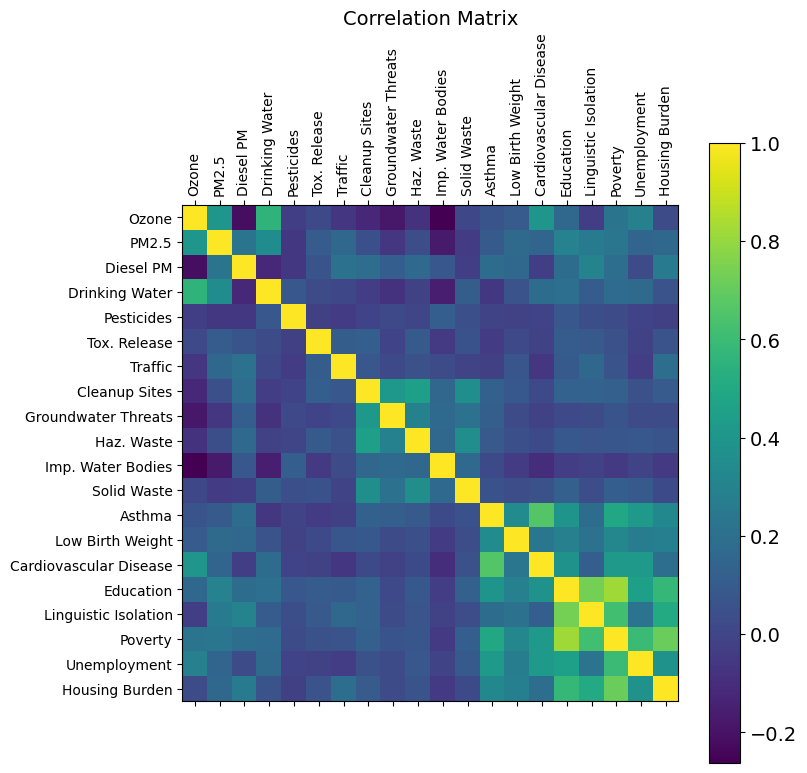

In [12]:
# add labels and a legend for the large correlation map

f = plt.figure(figsize=(8,8)) # figure size 
plt.matshow(df_all.corr(), fignum=f.number) # type of plot
plt.xticks(range(df_all.shape[1]), df_all.columns, fontsize=10, rotation=90) # x axis labels
plt.yticks(range(df_all.shape[1]), df_all.columns, fontsize=10) # y axis labels
cb = plt.colorbar() # add a color legend (called colorbar)
cb.ax.tick_params(labelsize=14) # add font size
plt.title('Correlation Matrix', fontsize=14) # add title
plt.savefig("corr_all.png")  #save


## 3B. Create a correlation matrix heatmap (colored) in seaborn



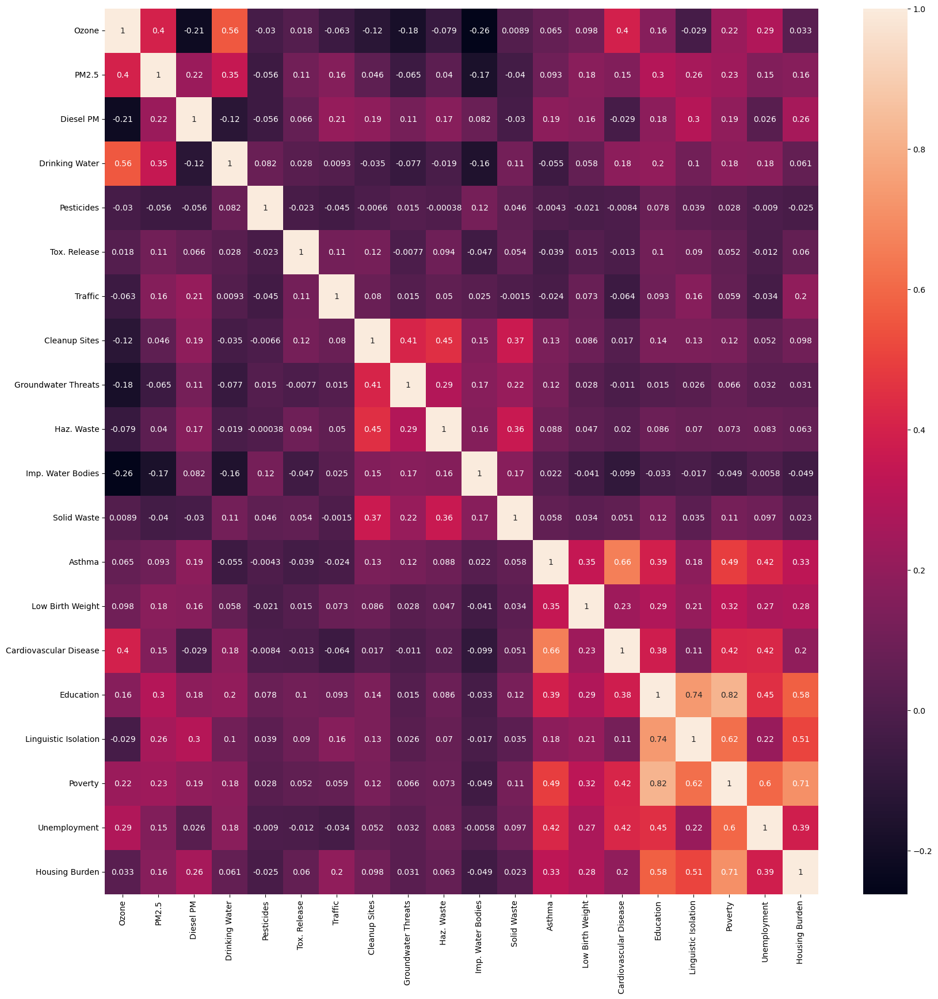

In [13]:
# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(20,20))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(df_all.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

# Step 3. Notes:

There are definitely some variables that have strong correlation and may be worth looking into more, a lot of the environmental factors and health factors are correlated with each other, and some of the demographic relationships are linked. This makes sense as communities will often have more than one demographic or environmental challenge.

## Step 3: Correlation continued, I will make a correlation plot for each of my subset dfs

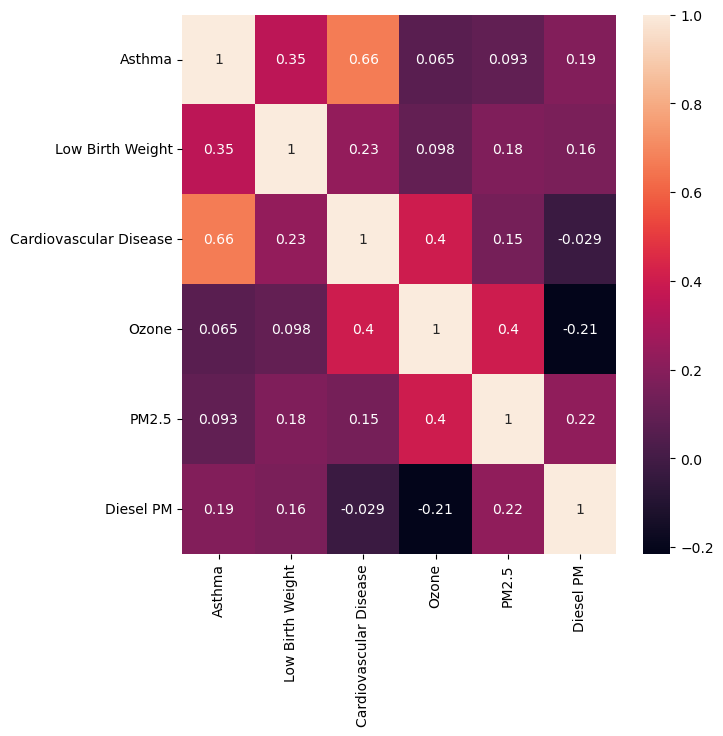

In [14]:
#  Pollutants and health

# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(7,7))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(df_pollutants.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

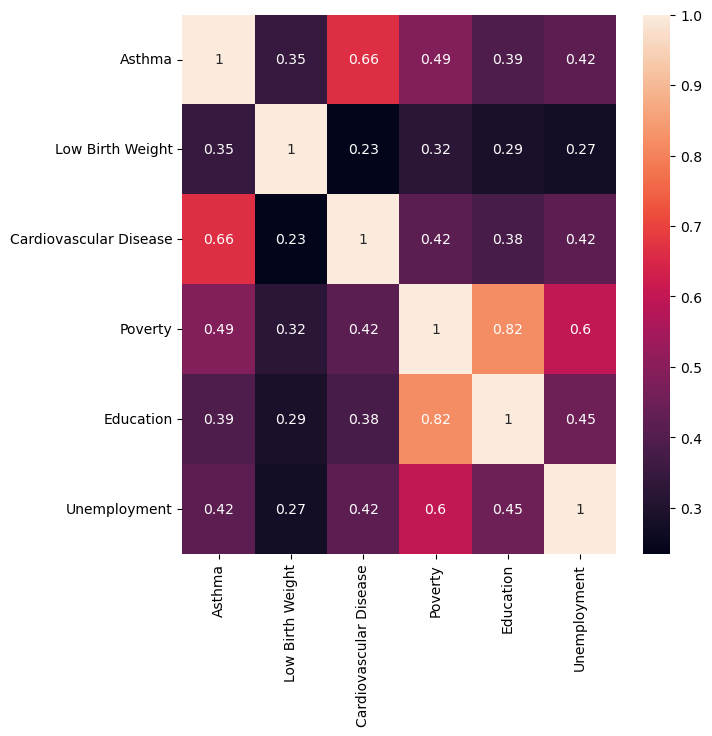

In [15]:
# health and demographics

# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(7,7))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(df_demohealth.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### There appear to be stronger postitive correlations between health and demographics, but the relationhships are still not significant

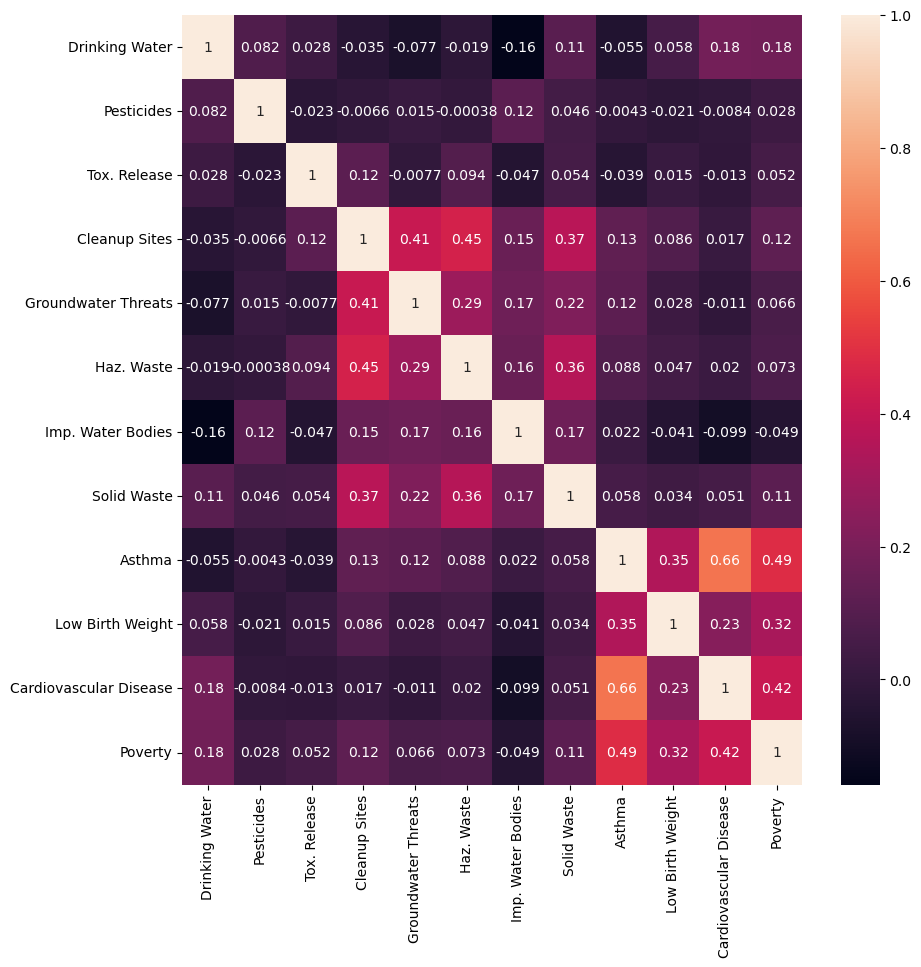

In [16]:
# health and ecohazards

# Create a subplot with matplotlib
f,ax = plt.subplots(figsize=(10,10))

# Create the correlation heatmap in seaborn by applying a heatmap onto the correlation matrix and the subplots defined above.
corr = sns.heatmap(df_ecohazards.corr(), annot = True, ax = ax) # The `annot` argument allows the plot to 
#place the correlation coefficients onto the heatmap.

### There do not seem to be any significant linear relationships between environmental hazards and health

# 4. Create a scatterplot (or plots) for the variables with the strongest correlations and examine the nature of their relationships.
Discuss the output in a markdown cell.

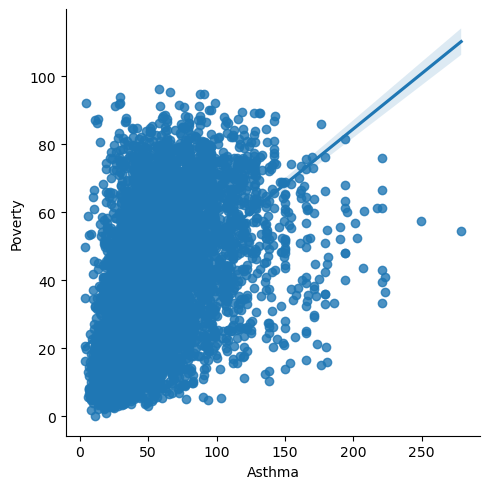

In [17]:
# I will make a scatter plot of asthma and poverty

sns.lmplot(x = 'Asthma', y = 'Poverty', data = df)

### There does seem to be some correlation but there is so much data in the middle that it is not a definitive linear trend

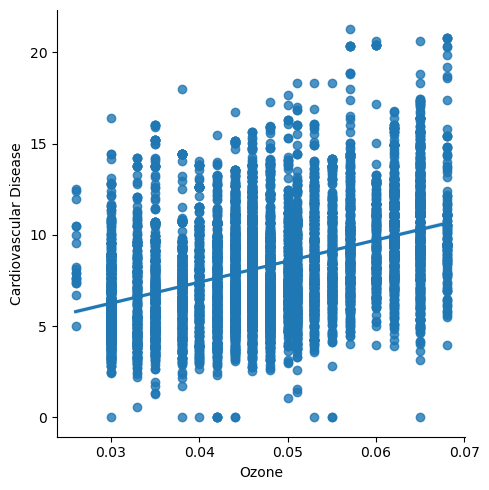

In [18]:
# I will also make a scatter plot of asthma and poverty

sns.lmplot(x = 'Ozone', y = 'Cardiovascular Disease', data = df)

### The nature of the data makes it difficult to see a trend since the ozone is in a pretty tight range, but it does seem that there is a slight positive correlation between the variables.

# 5. Create a pair plot of the entire data set.
Comment on the distribution of the variables and mark variables you’d like to explore further with an explanation of why.

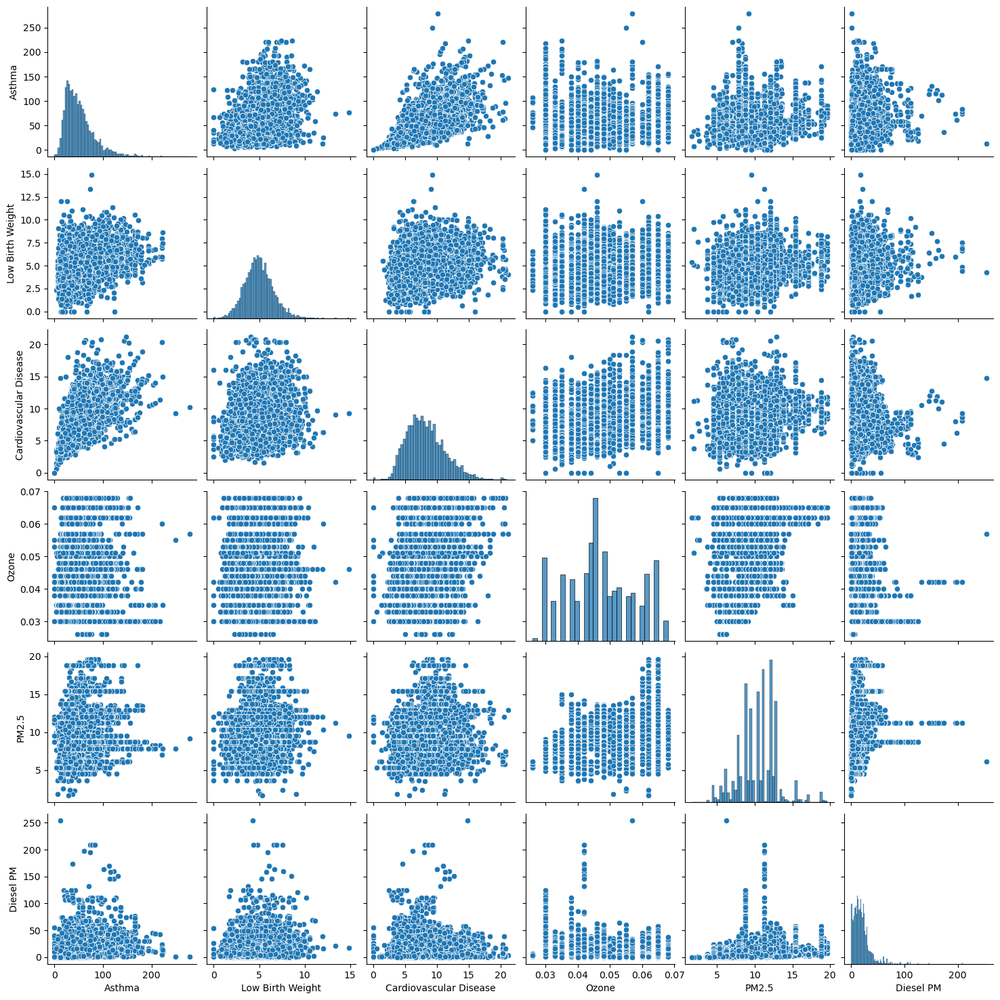

In [19]:
# Create a pair for pollutants data frame

g = sns.pairplot(df_pollutants)

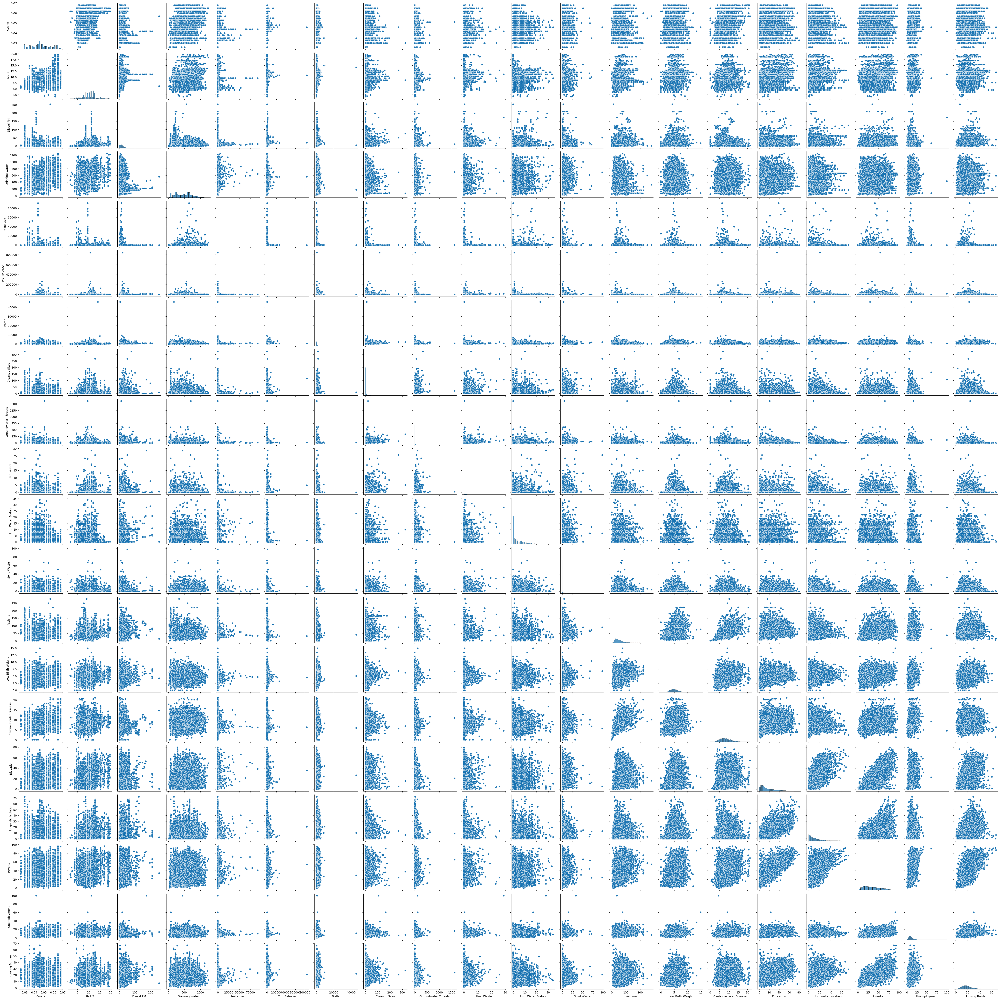

In [9]:
# Create a pair plot for demographics

g = sns.pairplot(df_all)

### There seems to be a link between the health factors - either communities or individuals may have higher rates of diseases, but the do not seem to be strongly correlated with environmental factors. There do not appear to be significant outliers, most of the data falls into a pretty similar area. It seems that the factor that could be the most linked with health issues is poverty

# 6. Create a categorical plot and interpret the results.

<Axes: xlabel='Poverty', ylabel='Count'>

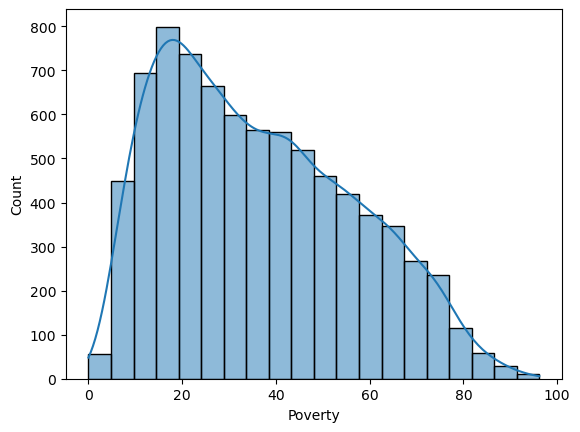

In [21]:
# create a histogram for poverty percentage

sns.histplot(df['Poverty'], bins = 20, kde = True)

### Create categories to group communities by the percentage of the population living in poverty

less than 20 - low poverty     
20- 49 - mid poverty     
50 and above - high poverty     


In [22]:
df.loc[df['Poverty'] < 20, 'Poverty Group'] = 'Low poverty'

In [23]:
df.loc[(df['Poverty'] >= 20) & (df['Poverty'] < 50), 'Poverty Group'] = 'Middle Poverty'

In [24]:
df.loc[df['Poverty'] >= 50, 'Poverty Group'] = 'High poverty'

In [25]:
# check the column

df['Poverty Group'].value_counts(dropna = False)

Middle Poverty    3707
High poverty      2144
Low poverty       2105
NaN                 79
Name: Poverty Group, dtype: int64

In [28]:
df['Poverty'].value_counts(dropna = False)

NaN     79
21.6    25
16.8    23
34.5    23
19.1    23
        ..
88.7     1
89.3     1
82.3     1
87.0     1
95.2     1
Name: Poverty, Length: 856, dtype: int64

### The NaN are from the poverty column

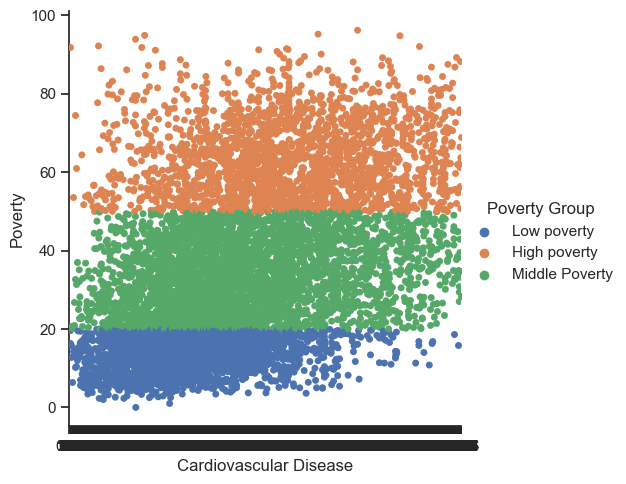

In [29]:
sns.set(style="ticks")
g = sns.catplot(x="Cardiovascular Disease", y="Poverty", hue="Poverty Group", data=df)

### Although the majority of the points in all poverty ranges are in the middle for cardiovascular disease, there are far fewer points from areas with low poverty with high rates of disease. The vast majority of these points come from low and middle poverty communities.

# 7. Revisit the questions you generated in the previous task and write answers to those you can based on the exploration you’ve conducted so far. Add any new questions that may have arisen based on the early findings in your visual exploration.


Do areas with higher air pollutants (ozone, PM2.5, Diesel PM) have higher rates of asthma, low birth rate, or cardiovascular disease?

   _There does not seem to be a direct correlation between air pollutants and health markers

How does traffic affect air pollution?

  _There is a weak correlation between Diesel PM and traffic, but not the other air pollution markers

How does poverty and education relate to health (asthma, low birth rate, or cardiovascular disease)?

  _There is a moderate correlation between poverty and education and asthma, low birth rate, or cardiovascular disease.


How does environmental hazards (Pesticides, traffic, cleanup site ect.) relate to health and poverty?

 _There is not a strong or moderate relationship between any of the environmental hazards and the health markers. There is a weak relationship between drinking water and poverty and drinking water and  cardiovascular disease.


New Questions:

How does population affect health factors?     
How does proximity to cities affect health factors?

# 8. Define any hypotheses that you can at this point. You’ll be testing these later on.

Hypothesis 1:

If an area has higher PM2.5 rating, there will be higher rates of asthma.

Hypothesis 2:

If an area has high traffic, it will have higher rates of Diesel PM.

Hypothesis 3:

If an area has higher rates of poverty, there will be a higher rate of cardiovascular disease.

Hypothesis 4:

If there is a lower rate of education in a community, there will be a higher rate of poverty.
